# Augmentation Visualization for WBC Classification

This notebook visualizes all the augmentations used in the ResNet50 training pipeline.

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from torchvision import transforms
from skimage import color
import albumentations as A
import pandas as pd

plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['font.size'] = 10

## Define Custom Augmentations

In [ ]:
class RandAdjustHE:
    """H&E stain augmentation using HED color space with gamma correction"""
    def __init__(self, prob=0.5, gamma_h=(0.7, 1.3), gamma_e=(0.7, 1.3), gamma_d=(0.7, 1.3)):
        self.prob = prob
        self.gamma_h_range = (np.log(min(gamma_h)), np.log(max(gamma_h)))
        self.gamma_e_range = (np.log(min(gamma_e)), np.log(max(gamma_e)))
        self.gamma_d_range = (np.log(min(gamma_d)), np.log(max(gamma_d)))

    def __call__(self, img):
        if np.random.rand() > self.prob:
            return img
            
        # Sample gamma values in log space
        gamma_h = np.exp(np.random.uniform(*self.gamma_h_range))
        gamma_e = np.exp(np.random.uniform(*self.gamma_e_range))
        gamma_d = np.exp(np.random.uniform(*self.gamma_d_range))
        
        # Convert PIL to numpy (HWC format)
        img_np = np.array(img).astype(np.float32) / 255.0
        
        # Convert to HED color space
        hed = color.rgb2hed(img_np)
        
        # Apply gamma correction to each channel
        h, e, d = hed[:, :, 0], hed[:, :, 1], hed[:, :, 2]
        h = h ** gamma_h
        e = e ** gamma_e
        d = d ** gamma_d
        
        # Reconstruct HED image
        hed = np.stack([h, e, d], axis=2)
        
        # Convert back to RGB and clip to valid range
        img_rgb = color.hed2rgb(hed)
        img_rgb = np.clip(img_rgb, 0.0, 1.0)
        
        img_uint8 = (img_rgb * 255.0).astype(np.uint8)
        return Image.fromarray(img_uint8)

In [10]:
def apply_noise_augmentation(tensor, noise_type='gauss'):
    """Apply noise augmentation to a tensor"""
    img_np = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    
    if noise_type == 'gauss':
        transform = A.Compose([A.GaussNoise(std_range=(0.2, 0.3), p=1.0)])
    elif noise_type == 'iso':
        transform = A.Compose([A.ISONoise(color_shift=(0.1, 0.5), intensity=(0.4, 0.7), p=1.0)])
    else:
        return tensor
    
    img_np = transform(image=img_np)['image']
    return torch.from_numpy(img_np).permute(2, 0, 1).float() / 255.0

## Load Sample Images

In [11]:
data_dir = 'raw_data'
train_csv = os.path.join(data_dir, 'train.csv')
train_dir = os.path.join(data_dir, 'train')

df = pd.read_csv(train_csv)
print(f"Total training samples: {len(df)}")
print(f"Classes: {sorted(df['labels'].unique())}")

sample_images = []
for cls in sorted(df['labels'].unique())[:4]:
    img_id = df[df['labels'] == cls].iloc[0]['ID']
    img_path = os.path.join(train_dir, img_id)
    sample_images.append((img_path, cls))

print(f"\nSelected samples:")
for path, cls in sample_images:
    print(f"  {cls}: {os.path.basename(path)}")

Total training samples: 33185
Classes: ['BA', 'BL', 'BNE', 'EO', 'LY', 'MMY', 'MO', 'MY', 'PC', 'PLY', 'PMY', 'SNE', 'VLY']

Selected samples:
  BA: 01416766.jpg
  BL: 01416775.jpg
  BNE: 01416781.jpg
  EO: 01416785.jpg


## 1. Individual Augmentations

Visualizing each augmentation separately to understand its effect.

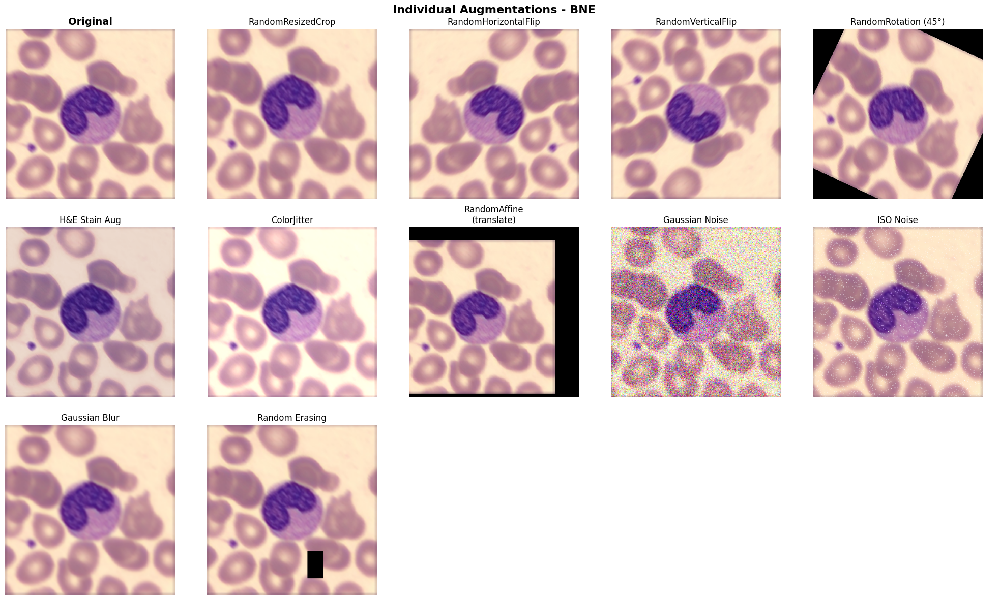

In [55]:
img_path, label = sample_images[2]
original = Image.open(img_path).convert('RGB')

fig, axes = plt.subplots(3, 5, figsize=(20, 12))
axes = axes.flatten()

axes[0].imshow(original)
axes[0].set_title('Original', fontsize=14, fontweight='bold')
axes[0].axis('off')

augmentations = [
    ('RandomResizedCrop', transforms.RandomResizedCrop(224, scale=(0.85, 1.0))),
    ('RandomHorizontalFlip', transforms.RandomHorizontalFlip(p=1.0)),
    ('RandomVerticalFlip', transforms.RandomVerticalFlip(p=1.0)),
    ('RandomRotation (45°)', transforms.RandomRotation(45)),
    ('H&E Stain Aug', RandAdjustHE(prob=1.0)),
    ('ColorJitter', transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)),
    ('RandomAffine\n(translate)', transforms.RandomAffine(degrees=0, translate=(0.125, 0.125), scale=(0.9, 1.1))),
]

for idx, (name, aug) in enumerate(augmentations, 1):
    img_copy = original.copy()
    if isinstance(aug, transforms.RandomResizedCrop):
        img_aug = aug(img_copy)
    else:
        img_aug = aug(img_copy)
    axes[idx].imshow(img_aug)
    axes[idx].set_title(name, fontsize=12)
    axes[idx].axis('off')

resize_transform = transforms.Resize((224, 224))
to_tensor = transforms.ToTensor()

img_tensor = to_tensor(resize_transform(original))
img_gauss = apply_noise_augmentation(img_tensor, 'gauss')
axes[8].imshow(img_gauss.permute(1, 2, 0).numpy())
axes[8].set_title('Gaussian Noise', fontsize=12)
axes[8].axis('off')

img_iso = apply_noise_augmentation(img_tensor, 'iso')
axes[9].imshow(img_iso.permute(1, 2, 0).numpy())
axes[9].set_title('ISO Noise', fontsize=12)
axes[9].axis('off')

blur_aug = transforms.GaussianBlur(3, sigma=(0.1, 1))
img_blur = blur_aug(resize_transform(original))
axes[10].imshow(img_blur)
axes[10].set_title('Gaussian Blur', fontsize=12)
axes[10].axis('off')

erase_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.RandomErasing(p=1.0, scale=(0.01, 0.02))
])
img_erase = erase_transform(original)
axes[11].imshow(img_erase.permute(1, 2, 0).numpy())
axes[11].set_title('Random Erasing', fontsize=12)
axes[11].axis('off')

for idx in range(12, 15):
    axes[idx].axis('off')

plt.suptitle(f'Individual Augmentations - {label}', fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

## 2. Full Training Pipeline

Showing multiple random samples with the full augmentation pipeline.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0013675228..1.0000002].


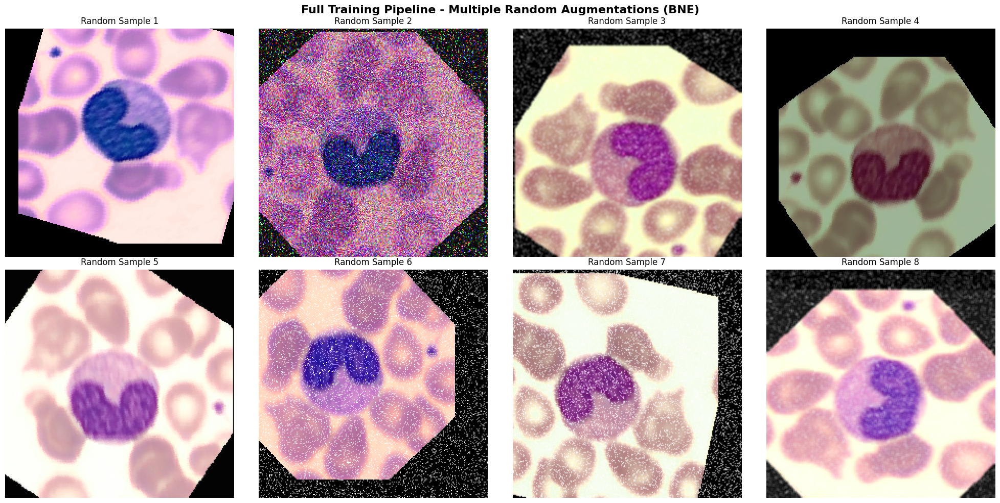

In [42]:
def build_full_train_transform():
    return transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(0.85, 1.0)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(degrees=45),
        RandAdjustHE(prob=0.5),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.2),
        transforms.RandomAffine(degrees=0, translate=(0.125, 0.125), scale=(0.9, 1.1)),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: apply_noise_augmentation(x, 'gauss') if np.random.rand() < 0.3 else x),
        transforms.Lambda(lambda x: apply_noise_augmentation(x, 'iso') if np.random.rand() < 0.3 else x),
        transforms.RandomApply([transforms.GaussianBlur(3, sigma=(0.1, 2.0))], p=0.3),
        #transforms.RandomErasing(p=0.15, scale=(0.02, 0.15))
    ])

train_transform = build_full_train_transform()

num_samples = 8
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx in range(num_samples):
    img_aug = train_transform(original.copy())
    axes[idx].imshow(img_aug.permute(1, 2, 0).numpy())
    axes[idx].set_title(f'Random Sample {idx + 1}', fontsize=12)
    axes[idx].axis('off')

plt.suptitle(f'Full Training Pipeline - Multiple Random Augmentations ({label})', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 3. Comparison Across Different Classes

Applying the same augmentation to different cell types.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].


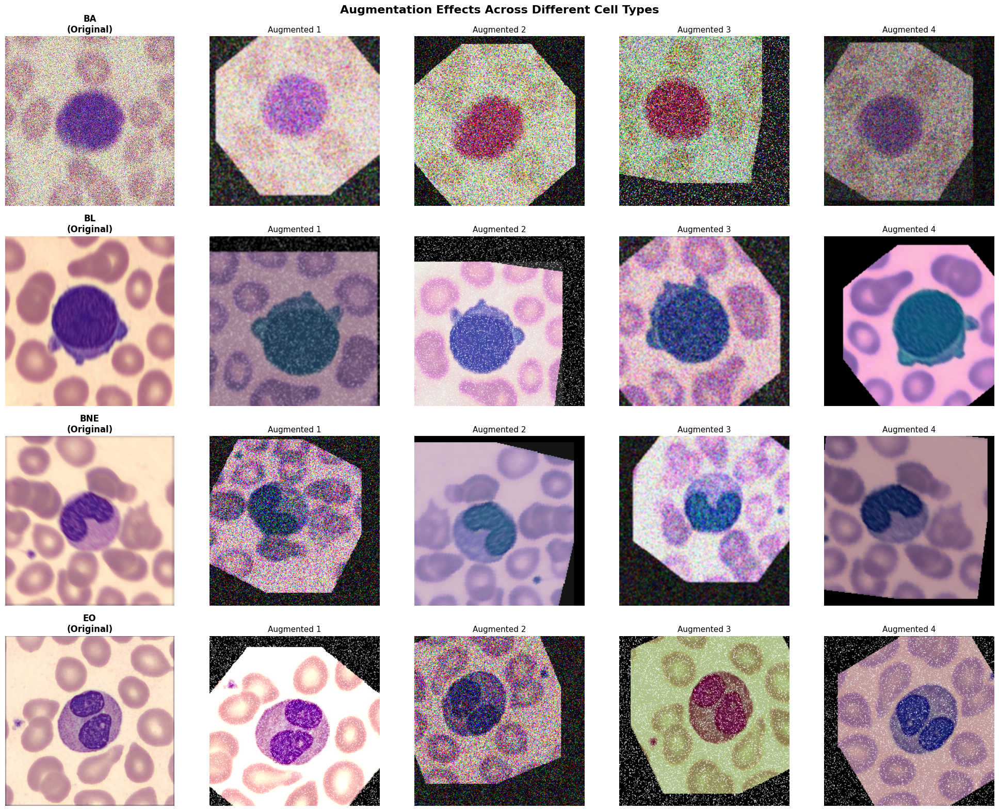

In [43]:
np.random.seed(42)
torch.manual_seed(42)

fig, axes = plt.subplots(len(sample_images), 5, figsize=(20, 4 * len(sample_images)))

for row_idx, (img_path, label) in enumerate(sample_images):
    img = Image.open(img_path).convert('RGB')
    
    axes[row_idx, 0].imshow(img)
    axes[row_idx, 0].set_title(f'{label}\n(Original)', fontsize=12, fontweight='bold')
    axes[row_idx, 0].axis('off')
    
    for col_idx in range(1, 5):
        img_aug = train_transform(img.copy())
        axes[row_idx, col_idx].imshow(img_aug.permute(1, 2, 0).numpy())
        axes[row_idx, col_idx].set_title(f'Augmented {col_idx}', fontsize=11)
        axes[row_idx, col_idx].axis('off')

plt.suptitle('Augmentation Effects Across Different Cell Types', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 4. Curriculum Learning Progression

Showing how noise augmentations intensify during training.

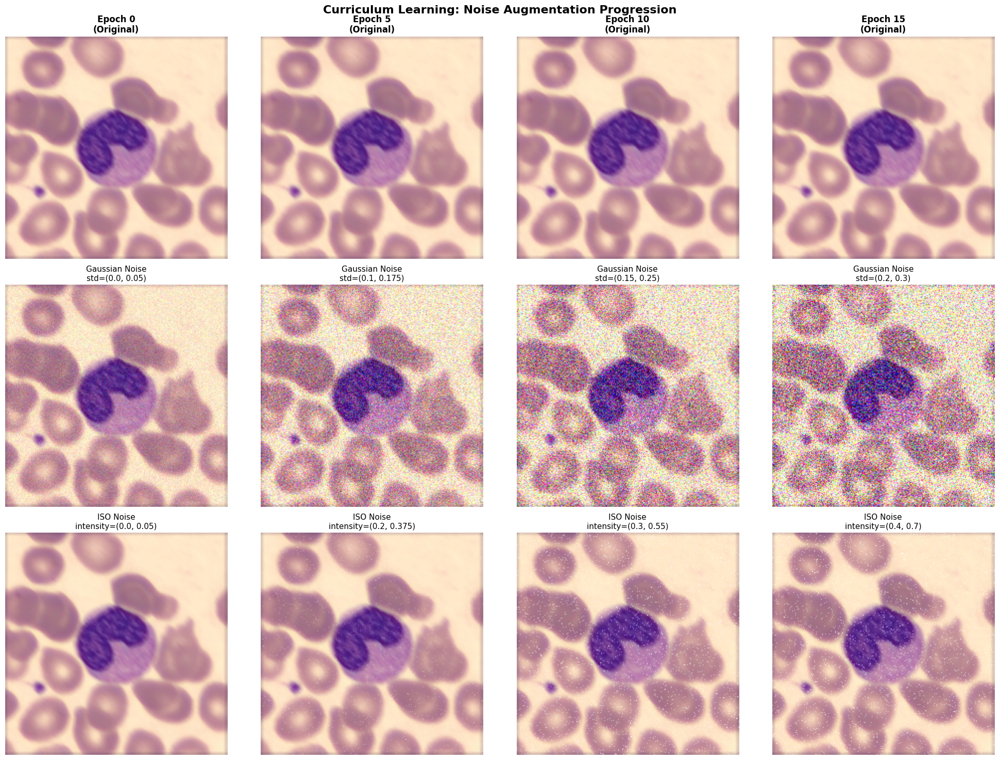

In [17]:
def apply_gauss_noise_with_std(tensor, std_range):
    img_np = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    transform = A.Compose([A.GaussNoise(std_range=std_range, p=1.0)])
    img_np = transform(image=img_np)['image']
    return torch.from_numpy(img_np).permute(2, 0, 1).float() / 255.0

def apply_iso_noise_with_intensity(tensor, intensity_range):
    img_np = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    transform = A.Compose([A.ISONoise(color_shift=(0.1, 0.5), intensity=intensity_range, p=1.0)])
    img_np = transform(image=img_np)['image']
    return torch.from_numpy(img_np).permute(2, 0, 1).float() / 255.0

resize_transform = transforms.Resize((224, 224))
to_tensor = transforms.ToTensor()
img_tensor = to_tensor(resize_transform(original))

epochs = [0, 5, 10, 15]
gauss_stds = [(0.0, 0.05), (0.1, 0.175), (0.15, 0.25), (0.2, 0.3)]
iso_intensities = [(0.0, 0.05), (0.2, 0.375), (0.3, 0.55), (0.4, 0.7)]

fig, axes = plt.subplots(3, 4, figsize=(20, 15))

for col_idx, (epoch, gauss_std, iso_int) in enumerate(zip(epochs, gauss_stds, iso_intensities)):
    axes[0, col_idx].imshow(img_tensor.permute(1, 2, 0).numpy())
    axes[0, col_idx].set_title(f'Epoch {epoch}\n(Original)', fontsize=12, fontweight='bold')
    axes[0, col_idx].axis('off')
    
    img_gauss = apply_gauss_noise_with_std(img_tensor, gauss_std)
    axes[1, col_idx].imshow(img_gauss.permute(1, 2, 0).numpy())
    axes[1, col_idx].set_title(f'Gaussian Noise\nstd={gauss_std}', fontsize=11)
    axes[1, col_idx].axis('off')
    
    img_iso = apply_iso_noise_with_intensity(img_tensor, iso_int)
    axes[2, col_idx].imshow(img_iso.permute(1, 2, 0).numpy())
    axes[2, col_idx].set_title(f'ISO Noise\nintensity={iso_int}', fontsize=11)
    axes[2, col_idx].axis('off')

plt.suptitle('Curriculum Learning: Noise Augmentation Progression', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## 5. MixUp and CutMix Augmentations

Batch-level augmentations that combine multiple images. Removed in latest version since mixup or cutup isn't really a thing we see in pathology

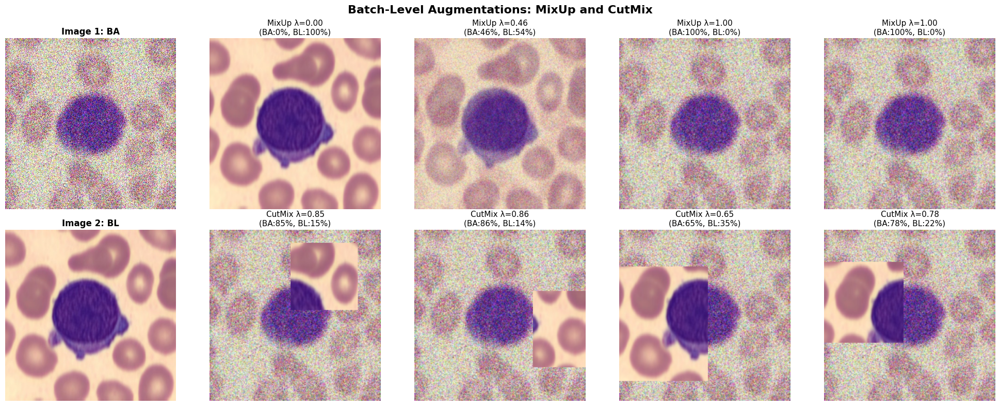

In [44]:
def mixup(img1, img2, alpha=0.2):
    """Apply MixUp augmentation to two images"""
    lam = np.random.beta(alpha, alpha)
    img1_tensor = transforms.ToTensor()(transforms.Resize((224, 224))(img1))
    img2_tensor = transforms.ToTensor()(transforms.Resize((224, 224))(img2))
    mixed = lam * img1_tensor + (1 - lam) * img2_tensor
    return mixed, lam

def cutmix(img1, img2, alpha=1.0):
    """Apply CutMix augmentation to two images"""
    lam = np.random.beta(alpha, alpha)
    img1_tensor = transforms.ToTensor()(transforms.Resize((224, 224))(img1)).clone()
    img2_tensor = transforms.ToTensor()(transforms.Resize((224, 224))(img2))
    
    _, H, W = img1_tensor.shape
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    
    img1_tensor[:, bby1:bby2, bbx1:bbx2] = img2_tensor[:, bby1:bby2, bbx1:bbx2]
    actual_lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (W * H))
    
    return img1_tensor, actual_lam

# Load two different images for mixing
img1_path, label1 = sample_images[0]
img2_path, label2 = sample_images[1]
img1 = Image.open(img1_path).convert('RGB')
img2 = Image.open(img2_path).convert('RGB')

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

# Original images
axes[0, 0].imshow(img1)
axes[0, 0].set_title(f'Image 1: {label1}', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

axes[1, 0].imshow(img2)
axes[1, 0].set_title(f'Image 2: {label2}', fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# MixUp examples with different lambdas
for i in range(1, 5):
    mixed, lam = mixup(img1, img2, alpha=0.2)
    axes[0, i].imshow(mixed.permute(1, 2, 0).numpy())
    axes[0, i].set_title(f'MixUp λ={lam:.2f}\n({label1}:{lam:.0%}, {label2}:{1-lam:.0%})', fontsize=11)
    axes[0, i].axis('off')

# CutMix examples
for i in range(1, 5):
    mixed, lam = cutmix(img1, img2, alpha=1.0)
    axes[1, i].imshow(mixed.permute(1, 2, 0).numpy())
    axes[1, i].set_title(f'CutMix λ={lam:.2f}\n({label1}:{lam:.0%}, {label2}:{1-lam:.0%})', fontsize=11)
    axes[1, i].axis('off')

plt.suptitle('Batch-Level Augmentations: MixUp and CutMix', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## Summary

### Augmentation Pipeline Configuration:

**Geometric Augmentations:**
- RandomResizedCrop: scale=(0.85, 1.0)
- RandomHorizontalFlip: p=0.5
- RandomVerticalFlip: p=0.5
- RandomRotation: degrees=45
- RandomAffine: translate=(0.125, 0.125), scale=(0.9, 1.1)

**Color Augmentations:**
- ColorJitter: brightness=0.3, contrast=0.3, saturation=0.3, hue=0.2
- H&E Stain Augmentation: p=0.5 (alpha/beta range: 0.8-1.2)

**Noise Augmentations (with Curriculum Learning):**
- GaussNoise: std_range=(0.0, 0.05) → (0.2, 0.3), p=0.1 → 0.5
- ISONoise: intensity=(0.0, 0.05) → (0.4, 0.7), p=0.1 → 0.5
- GaussianBlur: sigma=(0.1, 2.0), p=0.1 → 0.5

**Other:**
- RandomErasing: p=0.15, scale=(0.02, 0.15)
- MixUp: alpha=0.2, p=0.3 (during training)
- CutMix: alpha=1.0, p=0.3 (during training)

The curriculum learning gradually increases the difficulty of noise augmentations over the first 15 epochs using a cosine schedule.